In [12]:
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.ticker as ticker
import re

In [13]:
#1. Data Loading and Preparation 

files = [
    "../data/raw/LandsatComposite_Zurich_1985.tif",
    "../data/raw/LandsatComposite_Zurich_1988.tif",
    "../data/raw/LandsatComposite_Zurich_1991.tif",
    "../data/raw/LandsatComposite_Zurich_1994.tif",
    "../data/raw/LandsatComposite_Zurich_1997.tif",
    "../data/raw/LandsatComposite_Zurich_2000.tif",
    "../data/raw/LandsatComposite_Zurich_2003.tif",
    "../data/raw/LandsatComposite_Zurich_2006.tif",
    "../data/raw/LandsatComposite_Zurich_2009.tif",
    "../data/raw/LandsatComposite_Zurich_2012.tif",
    "../data/raw/LandsatComposite_Zurich_2015.tif",
    "../data/raw/LandsatComposite_Zurich_2018.tif",
    "../data/raw/LandsatComposite_Zurich_2021.tif",
    "../data/raw/LandsatComposite_Zurich_2024.tif",
]

# loading and building a 4D data Stack with Years, Spectral Bands, Row, Col
arrays = []

for f in files:
    with rasterio.open(f) as src:
        arr = src.read()
        arrays.append(arr)

stack = np.stack(arrays, axis=0)
print("4D Stack:", stack.shape)

years = np.arange(1985, 1985 + stack.shape[0])

print("Number of years in time series:", len(years))
print("Years covered:", years)


4D Stack: (14, 7, 252, 297)
Number of years in time series: 14
Years covered: [1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997 1998]


Band count: 7
Descriptions of the Bands: ('Blue', 'Green', 'Red', 'NIR', 'SWIR1', 'SWIR2', 'TIR1')


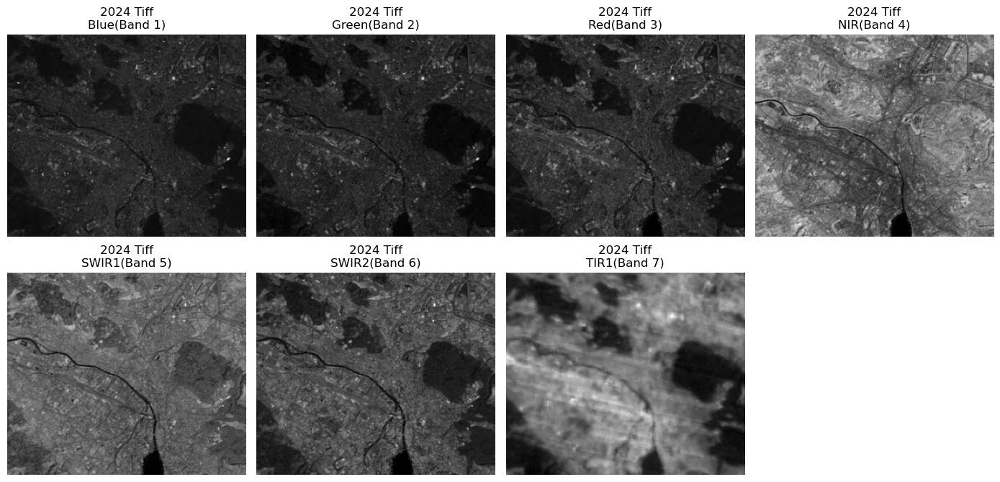

In [14]:
# 1.1 Spectral Band Inspection & RGB Visualization

# 1.1.1 Spectral band analysis
# Identifying the number of bands and band order in the 2024 Tiff
with rasterio.open(files[13]) as src:
    print("Band count:", src.count)
    print("Descriptions of the Bands:", src.descriptions)

# Visualization of the bands of the 2024 composite in grey 
# and adding the the description of the bands to the corresponding bands.
import matplotlib.pyplot as plt
import rasterio

band_names = ['Blue', 'Green', 'Red', 'NIR', 'SWIR1', 'SWIR2', 'TIR1']

with rasterio.open(files[13]) as src:
    plt.figure(figsize=(14, 7))  # larger figure for readability
    
    for i in range(1, src.count + 1):
        plt.subplot(2, 4, i)  # 2 rows, 4 columns
        plt.imshow(src.read(i), cmap="gray")
        plt.title(f"2024 Tiff\n{band_names[i-1]}(Band {i})")
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

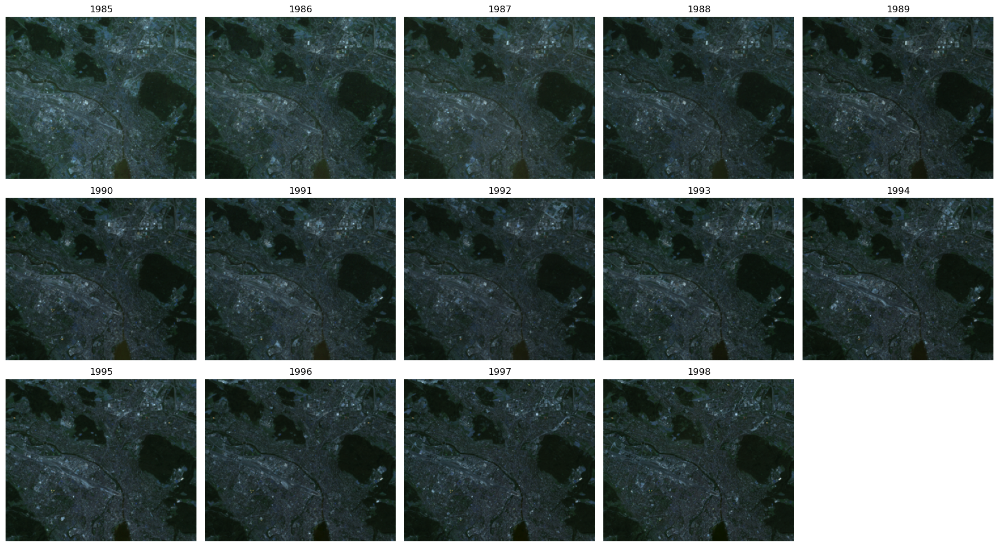

In [15]:
#1.2 Visualization of the Tiffs in the time series side by side with simple RGB
def simple_rgb(arr):
    """Use the first three bands as RGB with normalization."""
    rgb = arr[:3].transpose(1, 2, 0)  # (bands, rows, cols) → (rows, cols, bands)
    rgb = np.clip(rgb, 0, None)
    rgb = rgb / rgb.max()
    return rgb

fig, axes = plt.subplots(3, 5, figsize=(18, 10))
axes = axes.flatten()

for i in range(stack.shape[0]):
    arr = stack[i]               # take year i from the stack
    rgb = simple_rgb(arr)

    axes[i].imshow(rgb)
    axes[i].set_title(years[i])  # use extracted years list
    axes[i].axis("off")

# Hide the unused 15th subplot
axes[-1].axis("off")

plt.tight_layout()
plt.show()


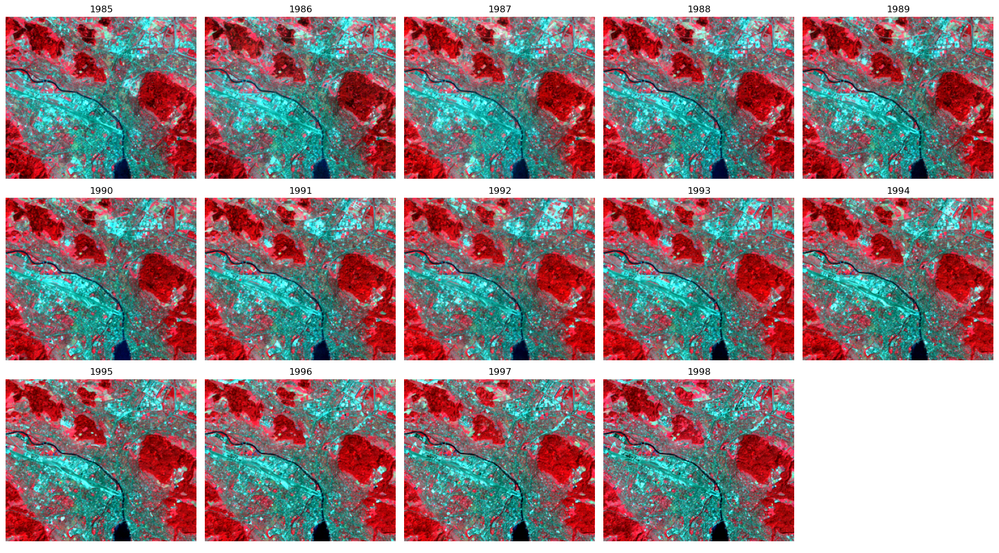

In [16]:
#1.1.3 Visualization of Tiffs with RGB stretch

#Function to create RGB with stretch
def get_rgb(arr):
    """Return a true-color RGB composite with percentile stretch."""
    
    # True-color mapping for your dataset:
    # R = band 4, G = band 3, B = band 2 (0-based: 3,2,1)
    r, g, b = arr[3], arr[2], arr[1]

    # Percentile stretch
    def stretch(x):
        p2, p98 = np.percentile(x, (2, 98)) #just random stretch that got assumed to be most fitting 
        return np.clip((x - p2) / (p98 - p2), 0, 1)

    rgb = np.dstack([stretch(r), stretch(g), stretch(b)])
    return rgb
    
# Plot all 14 RGB composites
fig, axes = plt.subplots(3, 5, figsize=(18, 10))
axes = axes.flatten()

for i in range(stack.shape[0]):
    arr = stack[i]
    rgb = get_rgb(arr)

    axes[i].imshow(rgb)
    axes[i].set_title(years[i])
    axes[i].axis("off")

# Hide the unused 15th subplot
axes[-1].axis("off")

plt.tight_layout()
plt.show()


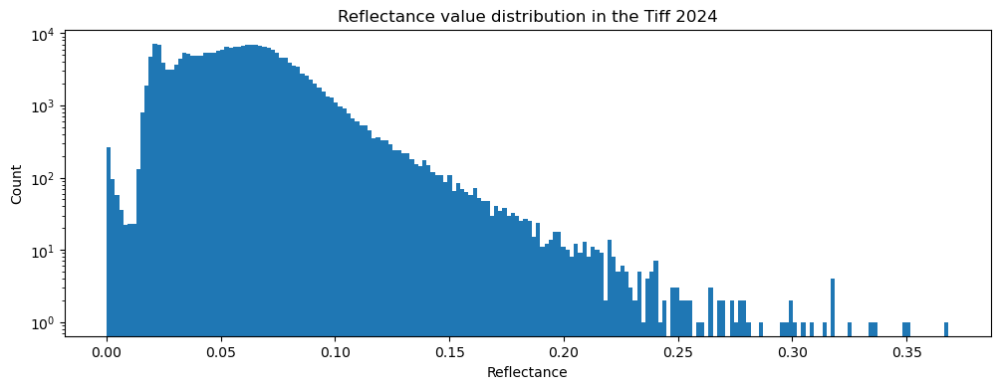

In [17]:
# 1.1.4 RGB Image of Year 2024 Tiff to have the most up to date reference for interpretation

# first analysing the reflectance distribution in the Tiff for accurate reflectance stretch
rgb = stack[13][:3].transpose(1, 2, 0)
rgb = np.clip(rgb, 0, None)

vals = rgb.flatten()
plt.figure(figsize=(12,4))
plt.hist(vals, bins=200)
plt.yscale("log")  # log scale helps see tails
plt.xlabel("Reflectance")
plt.ylabel("Count")
plt.title("Reflectance value distribution in the Tiff 2024")
plt.show()

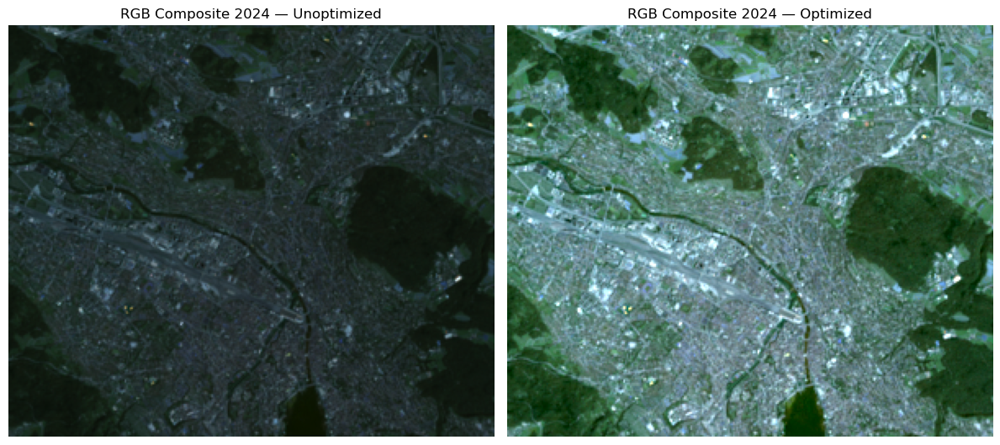

In [18]:
# 1.1.5 Composing the improved RGB image for the 2024 Tiff

year = stack[13]  # 2024
rgb = year[:3].transpose(1, 2, 0)

# Unoptimized RGB
year = stack[13]
rgb_raw = year[:3].transpose(1, 2, 0)
# Clip negatives and normalize by global max
rgb_raw = np.clip(rgb_raw, 0, None)
rgb_raw = rgb_raw / rgb_raw.max()

# However, a good reflectance stretch would be 0.5 to 99.5, as most reflectance values cluster between 0.02 – 0.12, with a long tail up to about 0.25 – 0.35. 
#That means the majority of pixels are quite dark, and only a small fraction are bright.

# Optimized RGB
rgb_opt = year[:3].transpose(1, 2, 0)
rgb_opt = np.clip(rgb_opt, 0, None)
# Percentile stretch (stronger)
# Apply gamma correction to brighten midtones
low, high = np.percentile(rgb_opt, (0.5, 99.5))
rgb_opt = np.clip((rgb_opt - low) / (high - low), 0, 1)
rgb_opt = np.power(rgb_opt, 0.7)

# Plot them side by side
plt.figure(figsize=(12,6))

# Unoptimized
plt.subplot(1,2,1)
plt.imshow(rgb_raw)
plt.title("RGB Composite 2024 — Unoptimized")
plt.axis("off")

# Optimized
plt.subplot(1,2,2)
plt.imshow(rgb_opt)
plt.title("RGB Composite 2024 — Optimized")
plt.axis("off")
plt.savefig("../outputs/RGB_Composite_Zurich2024_Optimized.png", dpi=300)
plt.tight_layout()
plt.show()

NDVI stack shape (14, 252, 297)


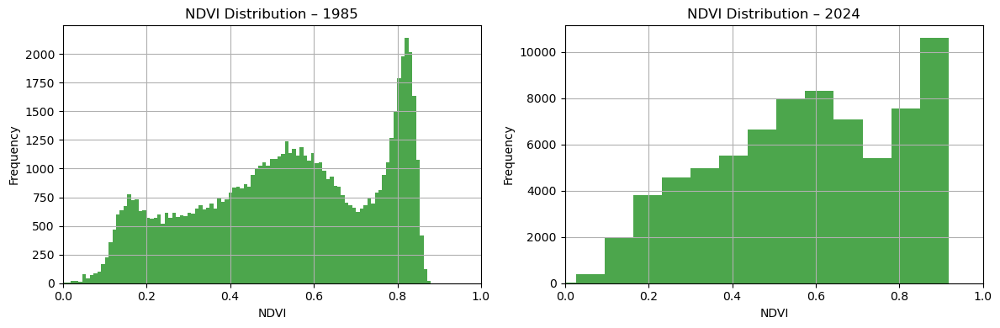

In [33]:
# 1.2. NDVI Compuation and Visualization

# 1.2.1 computing the NDVI for Tiffs in year 1985 and 2024
# stack shape: (years, height, width)
#Prepare LST stack 
#The NDVI becomes a single-band product and therefore eliminates this dimension in the NDVI stack. 
#It becomes a 3D stack with years, row, col: (14, 252, 297)
ndvi_stack = np.zeros((stack.shape[0], stack.shape[2], stack.shape[3])) #this creates the 3D datastack
print("NDVI stack shape", ndvi_stack.shape)

for i in range(stack.shape[0]):  # loops over all 14 years from i = 0: 1985 to i = 13: 2024
    red = stack[i, 2, :, :]      # band index 2 (Landsat Band 3 = Red): red becomes a 252×297 image of Red reflectance
    nir = stack[i, 3, :, :]      # band index 3 (Landsat Band 4 = NIR): nir becomes a 252×297 image of NIR reflectance

    # NDVI formula
    ndvi = (nir - red) / (nir + red) 
    # storing it: full NDVI time‑series cube 
    ndvi_stack[i] = ndvi 

# 1.2.2 Visualization of the distribution of NDVI for first year (1985) and last year (2024) in time series

# NDVI for first and last year
# Extract NDVI for 1985 (index 0) and 2024 (index 13)
ndvi_1985 = ndvi_stack[0]
ndvi_2024 = ndvi_stack[13]

# Flatten and remove NaNs, so the stack isn't in its 3D shape
vals_ndvi_1985 = ndvi_1985[np.isfinite(ndvi_1985)].flatten()
vals_ndvi_2024 = ndvi_2024[np.isfinite(ndvi_2024)].flatten()

# Plot histograms to analyse the distribution of the NDVI values for both years 1985 and 2024
plt.figure(figsize=(12,4))

# 1985 NDVI histogram
plt.subplot(1,2,1)
plt.hist(vals_ndvi_1985, bins=100, color="green", alpha=0.7)
plt.title("NDVI Distribution – 1985")
plt.xlabel("NDVI")
plt.ylabel("Frequency")
plt.grid(True)
plt.xlim(0, 1)
plt.tight_layout()


# 2024 NDVI histogram
plt.subplot(1,2,2)
plt.hist(vals_ndvi_2024, bins=100, color="green", alpha=0.7)
plt.title("NDVI Distribution – 2024")
plt.xlabel("NDVI")
plt.ylabel("Frequency")
plt.grid(True)
plt.xlim(0, 1)

plt.tight_layout()
plt.show()


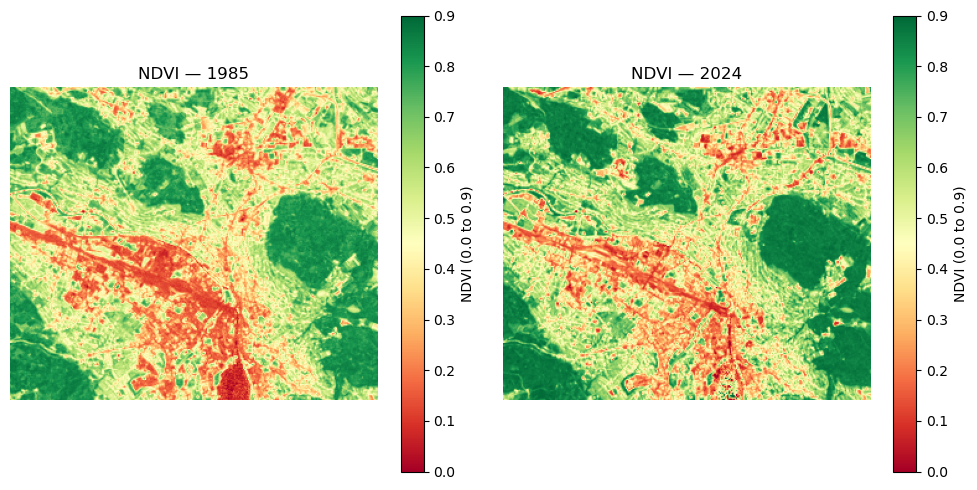

In [20]:
# 1.2.3 Visualizing the NDVI for the years 1985 and 2024

# Shared color scale for comparability and according to the histogram a range between 0 and 0.9 fits
vmin, vmax = 0, 0.9

plt.figure(figsize=(10,5))

# NDVI 1985
plt.subplot(1,2,1)
plt.imshow(ndvi_1985, cmap="RdYlGn", vmin=vmin, vmax=vmax)
plt.title("NDVI — 1985")
plt.axis("off")
plt.colorbar(label=f"NDVI ({vmin:.1f} to {vmax:.1f})")

# NDVI 2024
plt.subplot(1,2,2)
plt.imshow(ndvi_2024, cmap="RdYlGn", vmin=vmin, vmax=vmax)
plt.title("NDVI — 2024")
plt.axis("off")
plt.colorbar(label=f"NDVI ({vmin:.1f} to {vmax:.1f})")

plt.tight_layout()
plt.savefig("../outputs/NDVI_1985_2024.png", dpi=300)  # 300 dpi = publication quality
plt.show()


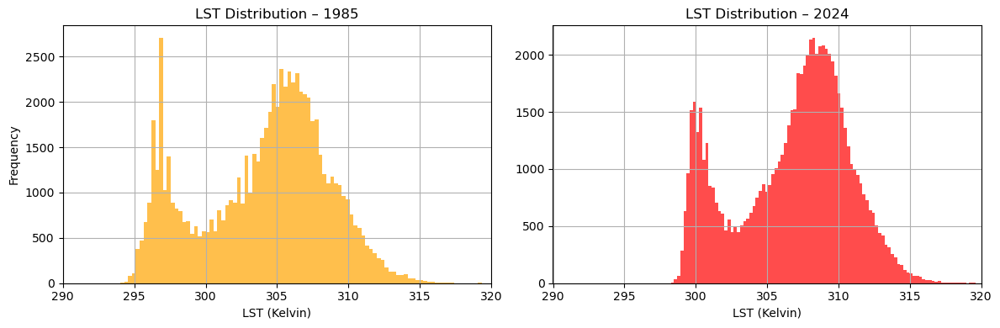

In [34]:
# 1.3 LST Computation & Visualization

# 1.3.1 computing the LST for Tiffs in year 1985 and 2024
# stack shape: (years, height, width)
# Constants for Landsat thermal conversion
#The LST becomes a single-band product. This is why the stack is a 3D stack 
lambda_ = 10.895e-6        # wavelength in meters
rho = 1.438e-2             # h*c/sigma
emissivity = 0.97          # typical for mixed urban/vegetation

lst_stack = np.zeros((stack.shape[0], stack.shape[2], stack.shape[3])) #this creates the 3D datastack similar to NDVI stack

for i in range(stack.shape[0]):
    bt = stack[i, 6, :, :]   # TIR1 = index 6, but Band 7

    # LST formula
    lst = bt / (1 + (lambda_ * bt / rho) * np.log(emissivity))
    lst_stack[i] = lst

# 1.3.2 Visualization of distribution of LST for first year (1985) and last year (2024) in time series

# Extract LST for 1985 (index 0) and 2024 (index 13)
lst_1985 = lst_stack[0]
lst_2024 = lst_stack[13]

# Flatten and remove NaNs, so the stack isn't in its 3D shape
vals_lst_1985 = lst_1985[np.isfinite(lst_1985)].flatten()
vals_lst_2024 = lst_2024[np.isfinite(lst_2024)].flatten()

# Plot histograms to analyse the distribution of the LST values for both years 1985 and 2024
plt.figure(figsize=(12,4))

# 1985 LST histogram
plt.subplot(1,2,1)
plt.hist(vals_lst_1985, bins=100, color="orange", alpha=0.7)
plt.title("LST Distribution – 1985")
plt.xlabel("LST (Kelvin)")
plt.ylabel("Frequency")
plt.xlim(290, 320)
plt.grid(True)

# 2024 LST histogram 
plt.subplot(1,2,2)
plt.hist(vals_lst_2024, bins=100, color="red", alpha=0.7)
plt.title("LST Distribution – 2024")
plt.xlabel("LST (Kelvin)")
plt.xlim(290, 320)
plt.grid(True)

plt.tight_layout()
plt.show()



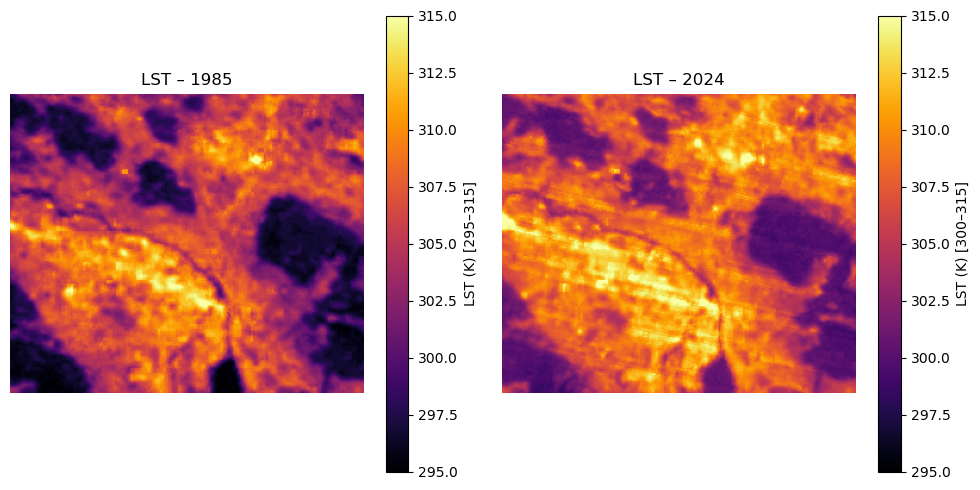

In [22]:
# 1.3.3 Visualizing the LST for the years 1985 and 2024

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(lst_1985, cmap="inferno", vmin=295, vmax=315)
plt.title("LST – 1985")
plt.axis("off")
plt.colorbar(label="LST (K) [295–315]")


plt.subplot(1,2,2)
plt.imshow(lst_2024, cmap="inferno", vmin=295, vmax=315)
plt.title("LST – 2024")
plt.axis("off")
plt.colorbar(label="LST (K) [300–315]")


plt.tight_layout()
plt.savefig("../outputs/LST_1985_and_2024.png", dpi=300)  # 300 dpi = publication quality
plt.show()

Mean NDVI in 1985: 0.53
Mean NDVI in 2024: 0.57
Mean LST in the year 1985: 30.90 °C
Mean LST in the year 2024: 33.63 °C


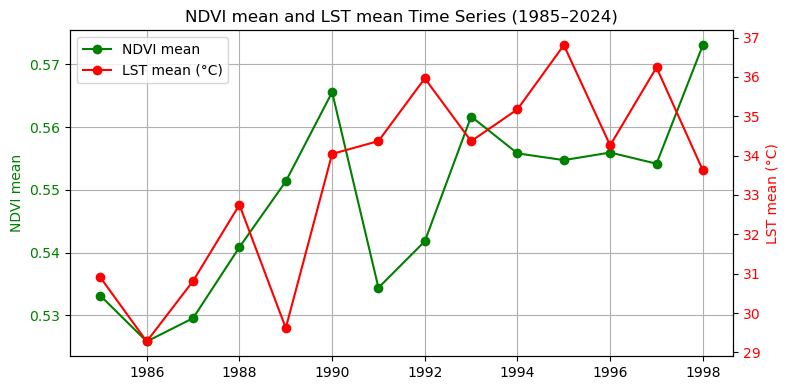

In [35]:
# 1.4 Yearly Statistics & Time Series

# 1.4.1 Computing yearly statistics for NDVI and LST (each year)
# NDVI statistics
ndvi_mean = np.nanmean(ndvi_stack, axis=(1,2))
ndvi_std  = np.nanstd(ndvi_stack, axis=(1,2))
ndvi_min  = np.nanmin(ndvi_stack, axis=(1,2))
ndvi_max  = np.nanmax(ndvi_stack, axis=(1,2))

print(f"Mean NDVI in 1985: {ndvi_mean[0]:.2f}") # NDVI mean 1985, to 2 decimal places
print(f"Mean NDVI in 2024: {ndvi_mean[13]:.2f}") # NDVI mean 2024, to 2 decimal places

# LST celcius conversion
lst_celsius = lst_stack - 273.15

# LST statistics
lst_mean = np.nanmean(lst_celsius, axis=(1,2))
lst_std  = np.nanstd(lst_celsius, axis=(1,2))
lst_min  = np.nanmin(lst_celsius, axis=(1,2))
lst_max  = np.nanmax(lst_celsius, axis=(1,2))

print(f"Mean LST in the year 1985: {lst_mean[0]:.2f} °C") #LST mean 1985, to 2 decimal places
print(f"Mean LST in the year 2024: {lst_mean[13]:.2f} °C") # LST mean 2024, to 2 decimal places

# 1.4.2 Visualizing the NDVI mean and LST mean Time Series (1985-2024)
# Fix the years array to match the number of time steps
years = np.arange(1985, 1985 + ndvi_stack.shape[0])

fig, ax1 = plt.subplots(figsize=(8,4))

# NDVI mean (left axis)
line1 = ax1.plot(years, ndvi_mean, color='green', marker='o', label='NDVI mean')
ax1.set_ylabel("NDVI mean", color='green')
ax1.tick_params(axis='y', labelcolor='green')

# LST mean (right axis)
ax2 = ax1.twinx()
line2 = ax2.plot(years, lst_mean, color='red', marker='o', label='LST mean (°C)')
ax2.set_ylabel("LST mean (°C)", color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Combine legends
lines = line1 + line2
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper left')

ax1.grid(True)
plt.title("NDVI mean and LST mean Time Series (1985–2024)")
plt.tight_layout()
plt.savefig("../outputs/NDVI_LST_Mean_Timeseries.png", dpi=300)  # 300 dpi = publication quality
plt.show()


NDVI 95% interval:
  2.5%  = -0.005731123478256043
 97.5%  = 0.006014520647272807

LST 95% interval:
  2.5%  = 0.07117138565633879
 97.5%  = 0.21820877761457344


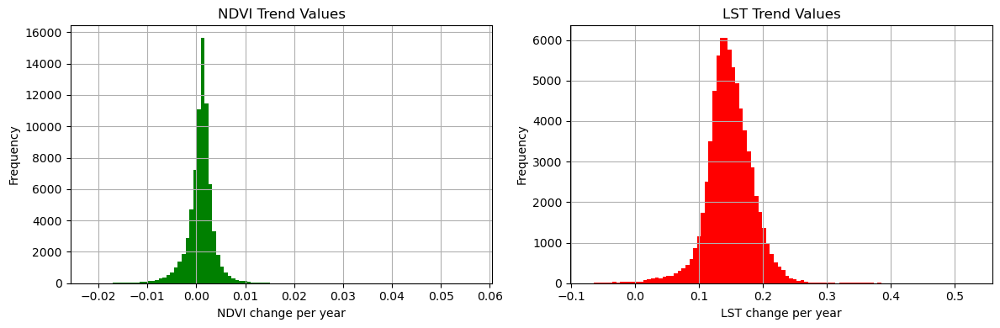

In [24]:
# 2. Trend Analysis

# Define the time axis
years = np.array([1985, 1988, 1991, 1994, 1997, 2000, 2003, 2006,
                  2009, 2012, 2015, 2018, 2021, 2024])

assert ndvi_stack.shape[0] == len(years), "Year count does not match NDVI stack!"
rows = ndvi_stack.shape[1]
cols = ndvi_stack.shape[2]

# 2.1 NDVI Trend
ndvi_trend = np.full((rows, cols), np.nan)

for i in range(rows):
    for j in range(cols):
        ndvi_series = ndvi_stack[:, i, j]
        mask = np.isfinite(ndvi_series)

        if np.sum(mask) >= 3:
            slope_ndvi, _ = np.polyfit(years[mask], ndvi_series[mask], 1)
            ndvi_trend[i, j] = slope_ndvi

# 2.2 LST trend
lst_trend = np.full((rows, cols), np.nan)

for i in range(rows):
    for j in range(cols):
        lst_series = lst_stack[:, i, j]
        mask = np.isfinite(lst_series)

        if np.sum(mask) >= 3:
            slope_lst, _ = np.polyfit(years[mask], lst_series[mask], 1)
            lst_trend[i, j] = slope_lst

# histograms for NDVI trend and LST trend
fig, axes = plt.subplots(1, 2, figsize=(12,4))

# Compute 2.5% and 97.5% percentiles
ndvi_p2, ndvi_p97 = np.nanpercentile(ndvi_trend, [2.5, 97.5])
lst_p2,  lst_p97  = np.nanpercentile(lst_trend,  [2.5, 97.5])

print("NDVI 95% interval:")
print("  2.5%  =", ndvi_p2)
print(" 97.5%  =", ndvi_p97)

print("\nLST 95% interval:")
print("  2.5%  =", lst_p2)
print(" 97.5%  =", lst_p97)

# NDVI trend histogram
axes[0].hist(ndvi_trend[np.isfinite(ndvi_trend)], bins=100, color="green")
axes[0].set_title("NDVI Trend Values")
axes[0].set_xlabel("NDVI change per year")
axes[0].set_ylabel("Frequency")
axes[0].grid(True)

# LST trend histogram
axes[1].hist(lst_trend[np.isfinite(lst_trend)], bins=100, color="red")
axes[1].set_title("LST Trend Values")
axes[1].set_xlabel("LST change per year")
axes[1].set_ylabel("Frequency")
axes[1].grid(True)

plt.tight_layout()
plt.show()

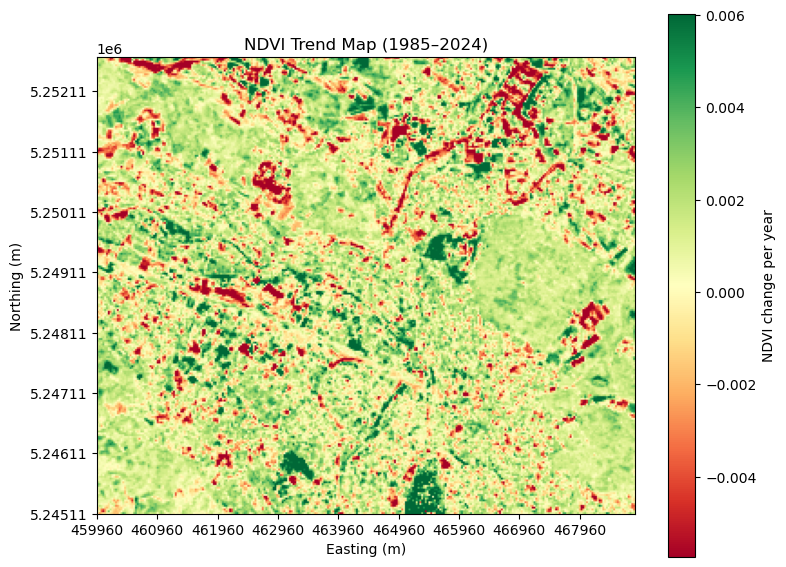

In [25]:
# 2.1.1 Plotting the NDVI Trend for 1985 to 2024

# Load spatial metadata for plotting
with rasterio.open(files[0]) as src:
    bounds = src.bounds
    transform = src.transform

# Plot NDVI trend map

plt.figure(figsize=(8,6))
plt.imshow(
    ndvi_trend,
    cmap="RdYlGn",
    extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
    vmin=-0.005731123478256043, vmax=0.006014520647272807 #according to the histogram: -0.01 and 0.01 are good fitting values
)
plt.colorbar(label="NDVI change per year")
plt.title("NDVI Trend Map (1985–2024)")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.xticks(np.arange(bounds.left, bounds.right, 1000))
plt.yticks(np.arange(bounds.bottom, bounds.top, 1000))
plt.tight_layout()
plt.savefig("../outputs/NDVI_Trend_Map.png", dpi=300)  # 300 dpi = publication quality
plt.show()


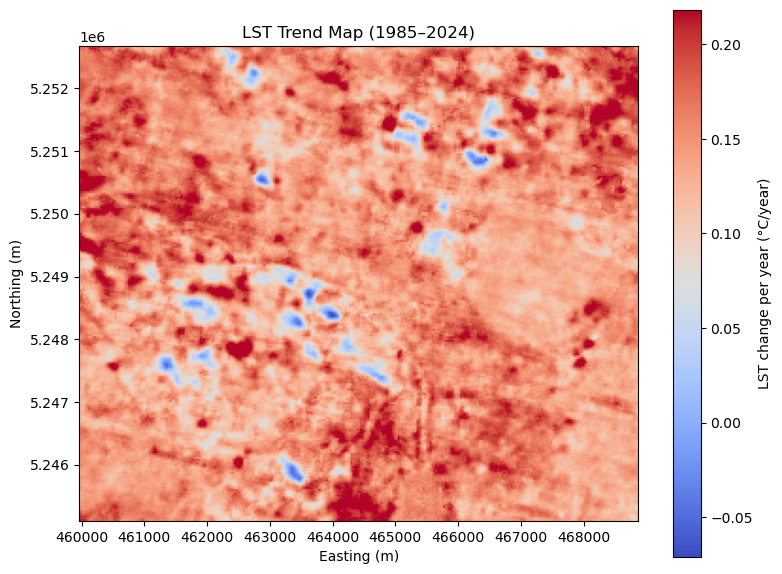

In [26]:
# 2.2.1 Plotting the LST Trend for 1985 to 2024

# Plot LST trend map
plt.figure(figsize=(8,6))
plt.imshow(
    lst_trend,
    cmap="coolwarm",  # or "RdBu_r"
    extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
    vmin=- 0.07117138565633879, vmax=0.21820877761457344 #according to the histogram: -0.05 and 0.25 are good fitting values
)
plt.colorbar(label="LST change per year (°C/year)")
plt.title("LST Trend Map (1985–2024)")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.tight_layout()
plt.show()


NDVI 95% interval:
  2.5%  = -0.17415590418231355
 97.5%  = 0.18378065097005056

LST 95% interval:
  2.5%  = 1.8170308047993902
 97.5%  = 5.210701633386186


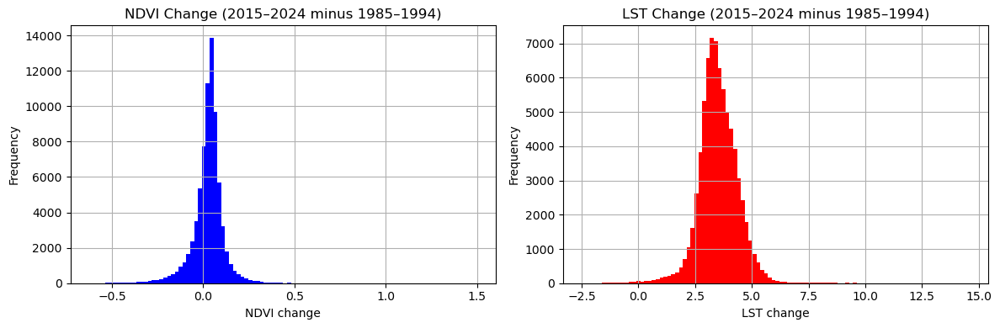

In [36]:
# 3. Early vs Late Period Change Detection 

# 3.1 NDVI change map 
# NDVI change map with early mean and late mean periods for a comparison 
# Define early and late periods to compare  
early_ndvi = ndvi_stack[:4]      # 1985–1994
late_ndvi  = ndvi_stack[-4:]     # 2015–2024

# Compute mean NDVI for each period 
early_mean_ndvi = np.nanmean(early_ndvi, axis=0)
late_mean_ndvi  = np.nanmean(late_ndvi, axis=0)

# Compute change map for difference between mean early NDVI and mean late NDVI
ndvi_change = late_mean_ndvi - early_mean_ndvi

# 3.2 LST Change Map 
# LST Change Map (°C difference) with early mean and late mean periods for a comparison
#Define early and late periods to compare
early_lst = lst_stack[:7]      # 1985–1994
late_lst  = lst_stack[-7:]     # 2015–2024

# Convert Kelvin to Celsius 
early_mean_lst = np.nanmean(early_lst - 273.15, axis=0)
late_mean_lst  = np.nanmean(late_lst - 273.15, axis=0)

#Compute change map for difference between mean early NDVI and mean late NDVI
lst_change = late_mean_lst - early_mean_lst   # °C difference

# Histograms
fig, axes = plt.subplots(1, 2, figsize=(12,4))

# Compute 2.5% and 97.5% percentiles
ndvi_p2_5, ndvi_p97_5 = np.nanpercentile(ndvi_change, [2.5, 97.5])
lst_p2_5,  lst_p97_5  = np.nanpercentile(lst_change,  [2.5, 97.5])

print("NDVI 95% interval:")
print("  2.5%  =", ndvi_p2_5)
print(" 97.5%  =", ndvi_p97_5)

print("\nLST 95% interval:")
print("  2.5%  =", lst_p2_5)
print(" 97.5%  =", lst_p97_5)

# NDVI change histogram
axes[0].hist(ndvi_change[np.isfinite(ndvi_change)], bins=100, color="blue")
axes[0].set_title("NDVI Change (2015–2024 minus 1985–1994)")
axes[0].set_xlabel("NDVI change")
axes[0].set_ylabel("Frequency")
axes[0].grid(True)

# LST change histogram
axes[1].hist(lst_change[np.isfinite(lst_change)], bins=100, color="red")
axes[1].set_title("LST Change (2015–2024 minus 1985–1994)")
axes[1].set_xlabel("LST change")
axes[1].set_ylabel("Frequency")
axes[1].grid(True)

plt.tight_layout()
plt.show()


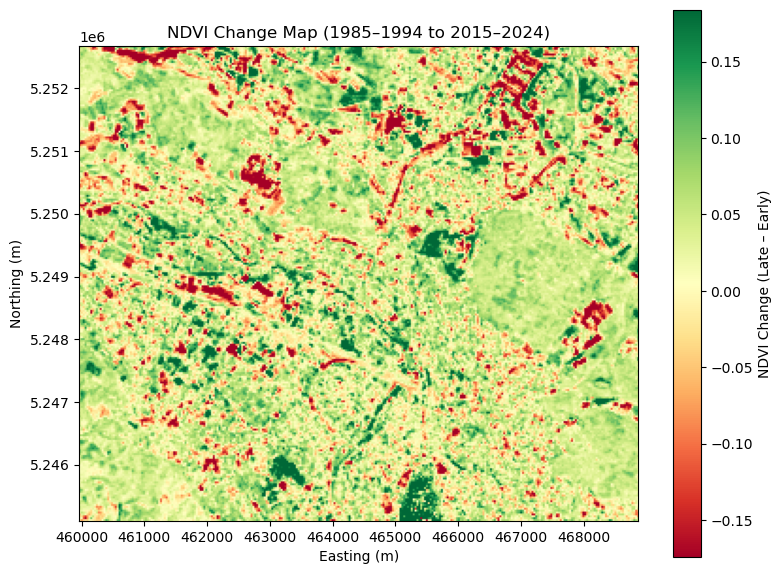

In [37]:
# 3.1.1 Plotting the NDVI change map
plt.figure(figsize=(8,6))
plt.imshow(
    ndvi_change,
    cmap="RdYlGn",
    extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
    vmin=-0.17415590418231355, vmax=  0.18378065097005056 #These values got chosen according to the computet histogram
)
plt.colorbar(label="NDVI Change (Late – Early)")
plt.title("NDVI Change Map (1985–1994 to 2015–2024)")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.tight_layout()
plt.savefig("../outputs/NDVI_Change_Map.png", dpi=300)
plt.show()


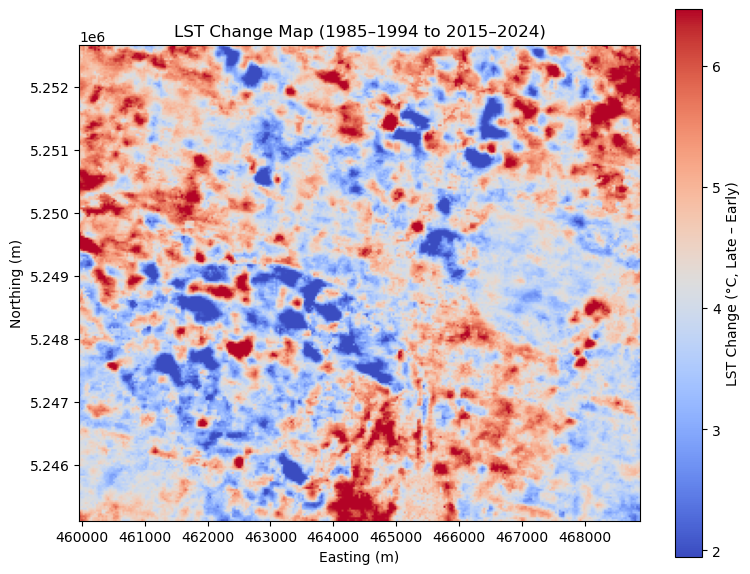

In [29]:
# 3.2.1 Plotting the LST change map
plt.figure(figsize=(8,6))
plt.imshow(
    lst_change,
    cmap="coolwarm",  # or "RdBu_r"
    extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
    vmin=1.9492960526313883, vmax=6.467006336363566
)
plt.colorbar(label="LST Change (°C, Late – Early)")
plt.title("LST Change Map (1985–1994 to 2015–2024)")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.tight_layout()
plt.savefig("../outputs/LST_Change_Map.png", dpi=300)
plt.show()


Valid pixels: 1047816
Correlation (r): -0.677
R²: 0.459


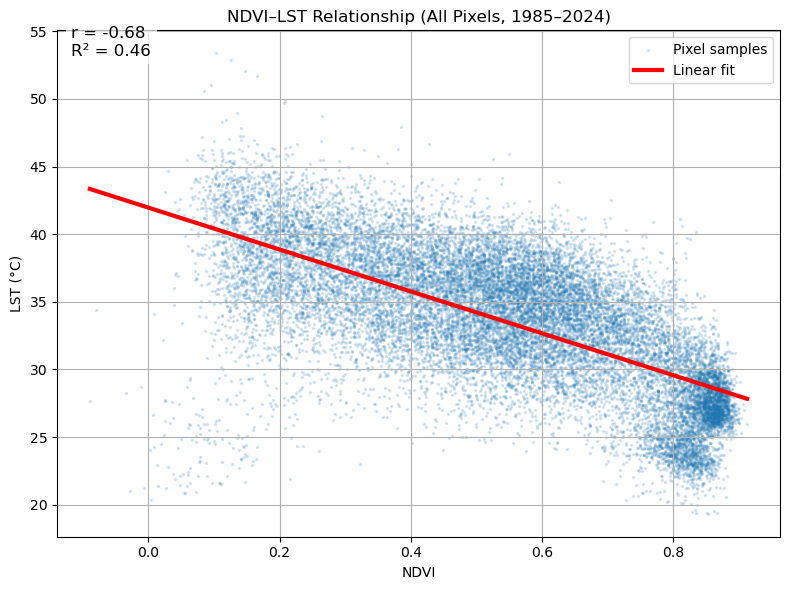

In [30]:
# 4. NDVI-LST Correlation Analysis

# Flatten NDVI and LST 3D stacks that were computet before into 1D arrays. 
# Each pixel from each year becomes one data point. 
# This gives out millions of NDVI–LST pairs.
ndvi_flat = ndvi_stack.flatten()
lst_flat = lst_stack.flatten()

# Convert LST from Kelvin to Celsius 
# Landsat LST is usually stored in Kelvin.
# Converting to °C makes the plot interpretable.
# 0 Kelvin = -273 °C so it needs to be subtracted.

lst_flat = lst_flat - 273.15

# Keep only the valid values 
#This ensures the regression and correlation work.
mask = np.isfinite(ndvi_flat) & np.isfinite(lst_flat) #This creates a boolean array (True/False) the same size as the NDVI array.
ndvi_clean = ndvi_flat[mask] #True: the value is valid (not NaN(not a number), not inf), False: the value is invalid.
lst_clean = lst_flat[mask]

print("Valid pixels:", len(ndvi_clean)) 

# 4.1 Scatterplot
# Subsample for plotting (to avoid millions of points) 
# randomly picking 20,000 points so the scatterplot stays readable (millions of points would be too dense).
np.random.seed(42)
N = min(20000, len(ndvi_clean))
idx = np.random.choice(len(ndvi_clean), size=N, replace=False)

x = ndvi_clean[idx]
y = lst_clean[idx]

# Regression line 
# The slope and intercept describe the NDVI–LST relationship.
slope, intercept = np.polyfit(x, y, 1) #This computes a linear regression with ndvi_clean(x) and lst_clean(y), then it fits a polynomial of first degree (1)
x_line = np.linspace(x.min(), x.max(), 200) #Creates 200 evenly spaced NDVI values.
y_line = slope * x_line + intercept #computes the predicted LST for each of the 200 NDVI values.

#Compute correlation coefficient (r) and R²
# r measures the strength and direction of the relationship.
# R² tells how much of LST variation is explained by NDVI.
corr = np.corrcoef(x, y)[0, 1]
r2 = corr**2

print(f"Correlation (r): {corr:.3f}")
print(f"R²: {r2:.3f}")

# Create the scatterplot + regression line
# This visualizes the cooling effect of vegetation.
plt.figure(figsize=(8,6))

# x: ndvi_clean values (subsampled), y: lst_clean values (subsampled)
# s=2: size of each dot (very small, because thousands of points)
# alpha=0.15: transparency (so overlapping points don’t form a black blob)
plt.scatter(x, y, s=2, alpha=0.15, label="Pixel samples")
plt.plot(x_line, y_line, color="red", linewidth=3, label="Linear fit")

plt.xlabel("NDVI")
plt.ylabel("LST (°C)")
plt.title("NDVI–LST Relationship (All Pixels, 1985–2024)")

plt.text(
    0.02, 0.95,
    f"r = {corr:.2f}\nR² = {r2:.2f}",
    transform=plt.gca().transAxes,
    fontsize=12,
    bbox=dict(facecolor="white", alpha=0.7, edgecolor="none")
)

plt.grid(True) #This makes the grid.
plt.legend()
plt.tight_layout() # This adjusts the spacing between all elements the figure.
plt.savefig("../outputs/Scatterplot_Correlation_NDVI-LST.png", dpi=300)  # 300 dpi = publication quality

plt.show()

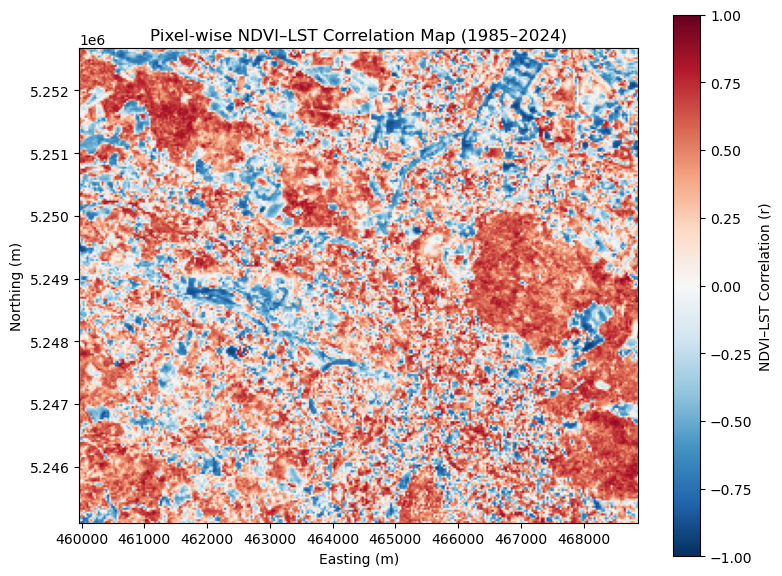

In [31]:
# 4.2 Correlation Map

#Ensuring that NDVI and LST stacks have the same shape. Each stack is then shaped like this: (years, rows, cols).
assert ndvi_stack.shape == lst_stack.shape

#Creating an empty 2D array to store the correlation coefficient (r) for each pixel
# The output map will have the same spatial dimensions as one NDVI/LST image
r_map = np.zeros((ndvi_stack.shape[1], ndvi_stack.shape[2]))  # empty map

# Loop through every pixel position (row i, column j)
for i in range(ndvi_stack.shape[1]):
    for j in range(ndvi_stack.shape[2]):
        ndvi_series = ndvi_stack[:, i, j]  # makes the NDVI time series for pixel (i, j)
        lst_series = lst_stack[:, i, j] # makes the NDVI time series for pixel (i, j)
        mask = np.isfinite(ndvi_series) & np.isfinite(lst_series) # Mask invalid values (NaN or infinite)
        # Computing correlation only if there are enough valid years
        if np.sum(mask) > 2:  # need at least 3 valid years
            r_map[i, j] = np.corrcoef(ndvi_series[mask], lst_series[mask])[0, 1]
        else:
            r_map[i, j] = np.nan # marked as missed if too few valid data points


# 4.2.1 Plotting the resulting correlation map
plt.figure(figsize=(8,6))

# Using a diverging colormap ("RdBu_r") to highlight negative (red) vs. positive (blue) correlations.
# extent defines real-world coordinates (Easting/Northing) for the axes that have been computet in 10.4.
plt.imshow(r_map, cmap="RdBu_r", vmin=-1, vmax=1,
           extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
plt.colorbar(label="NDVI–LST Correlation (r)")
plt.title("Pixel-wise NDVI–LST Correlation Map (1985–2024)")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.tight_layout()
plt.savefig("../outputs/Pixel-wise_NDVI-LST_Correlation_Map.png", dpi=300)  # 300 dpi = publication quality
plt.show()
